<a href="https://colab.research.google.com/github/cdh-catt/MachineLearning/blob/main/BuildAndTrainModel/TransferLearning/ModelHandGesture_TransferLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Make a copy in Drive to save any changes
# Or download this notebook

#Data Preprocessing

In [ ]:
import kagglehub # get dataset from kaggle

# Download latest version
# faster than mounting in Colab
path = kagglehub.dataset_download("agungmrf/indonesian-sign-language-bisindo")

print("Path to dataset files:", path)

100%|██████████| 1.36G/1.36G [00:20<00:00, 70.4MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/agungmrf/indonesian-sign-language-bisindo/versions/1


In [ ]:
import os
import shutil # for move files

# Define the destination path
destination_path = "/content"

# create directory, make sure path exist
os.makedirs(destination_path, exist_ok=True)

# Move the downloaded dataset to the destination
for item in os.listdir(path):
    source = os.path.join(path, item)
    shutil.move(source, destination_path)

print("Dataset moved to:", destination_path)


Dataset moved to: /content


#Data Exploration

Training Dataset:


Class: A - Sample Quantity: 350
-----------------------------------------------------


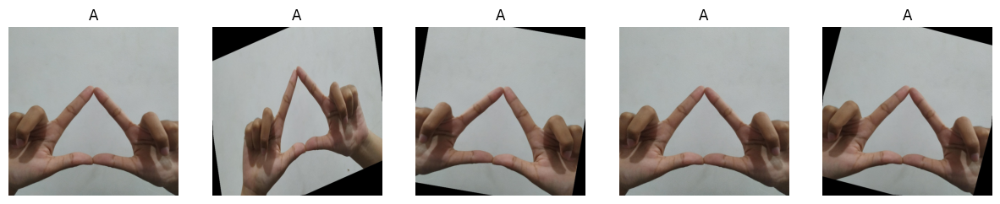

Class: P - Sample Quantity: 357
-----------------------------------------------------


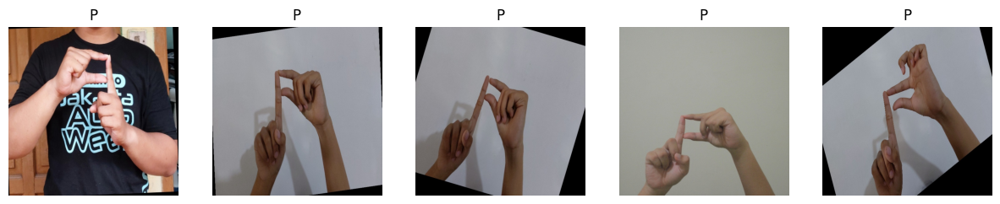

Class: K - Sample Quantity: 348
-----------------------------------------------------


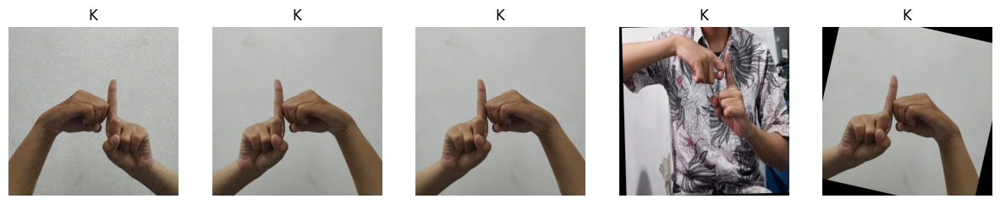

Class: L - Sample Quantity: 357
-----------------------------------------------------


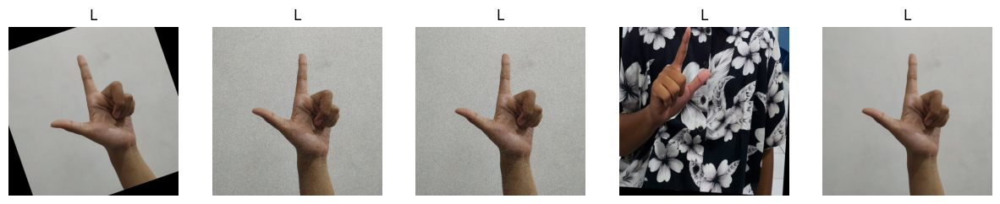

Class: J - Sample Quantity: 360
-----------------------------------------------------


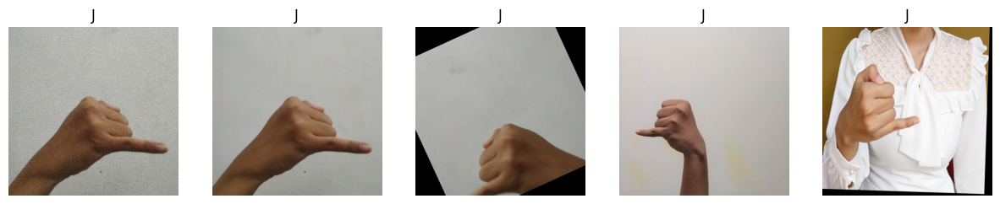

Class: D - Sample Quantity: 348
-----------------------------------------------------


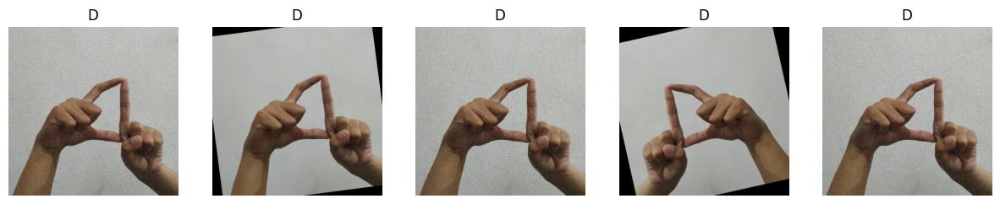

Class: R - Sample Quantity: 350
-----------------------------------------------------


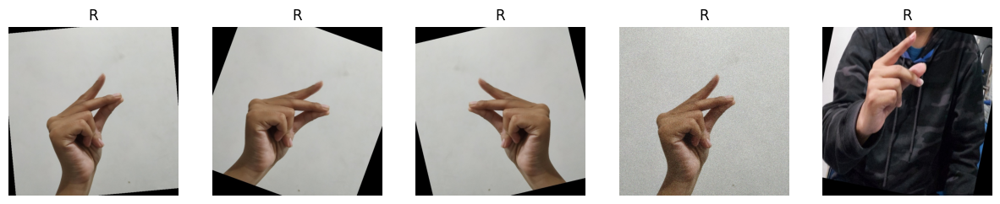

Class: B - Sample Quantity: 351
-----------------------------------------------------


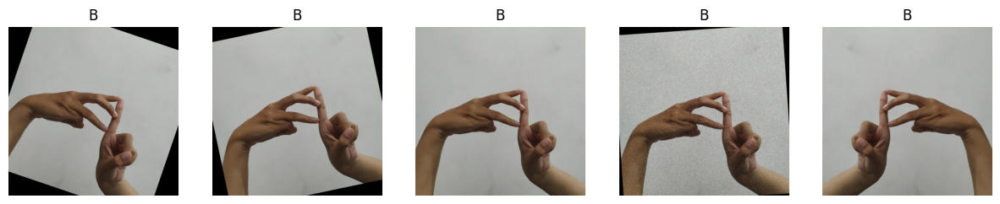

Class: H - Sample Quantity: 348
-----------------------------------------------------


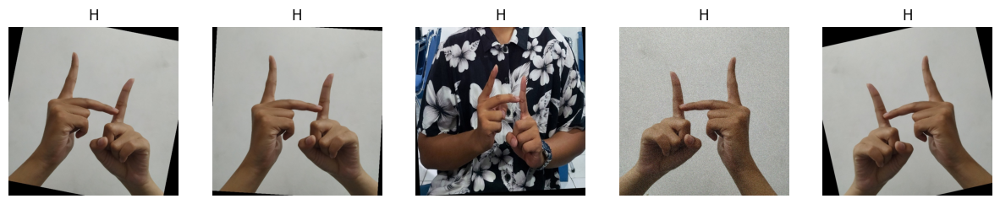

Class: S - Sample Quantity: 343
-----------------------------------------------------


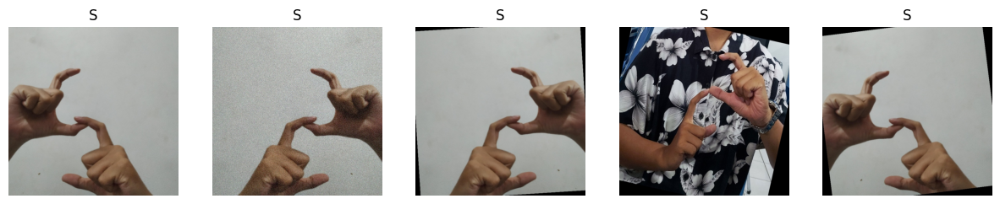

Class: C - Sample Quantity: 343
-----------------------------------------------------


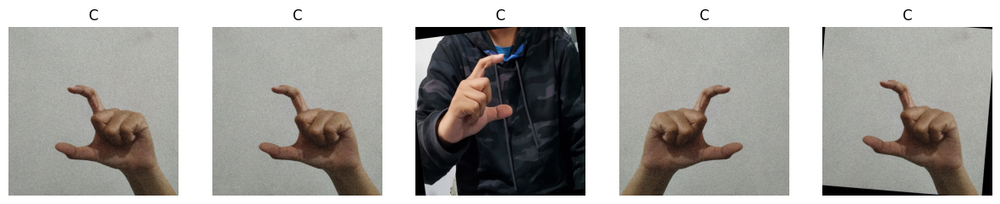

Class: T - Sample Quantity: 360
-----------------------------------------------------


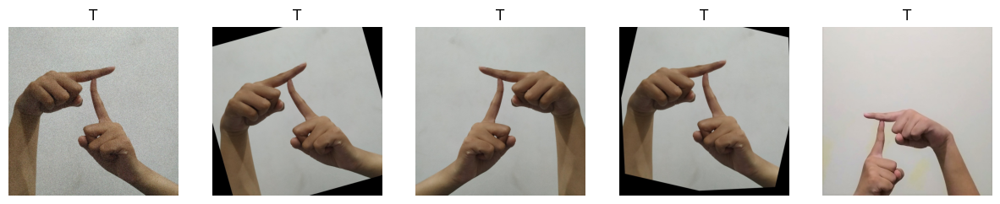

Class: F - Sample Quantity: 357
-----------------------------------------------------


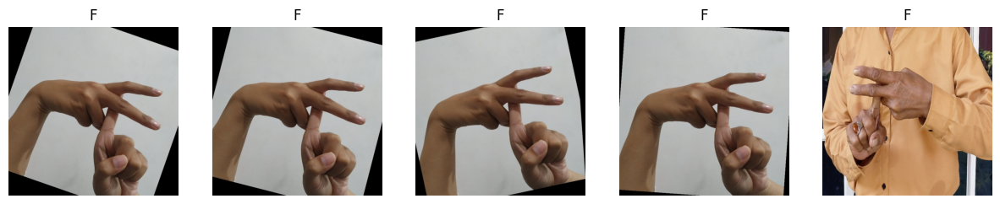

Class: V - Sample Quantity: 357
-----------------------------------------------------


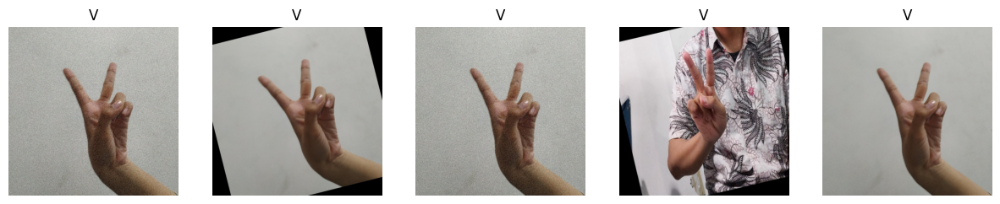

Class: G - Sample Quantity: 360
-----------------------------------------------------


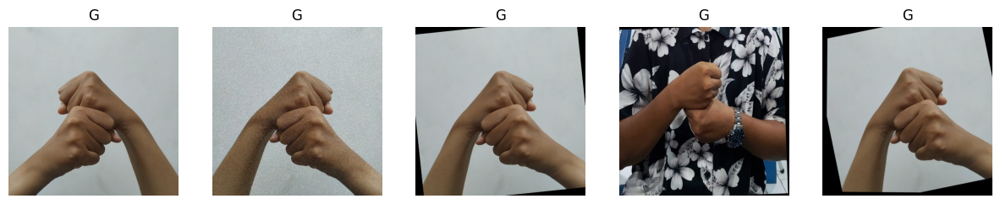

Class: E - Sample Quantity: 352
-----------------------------------------------------


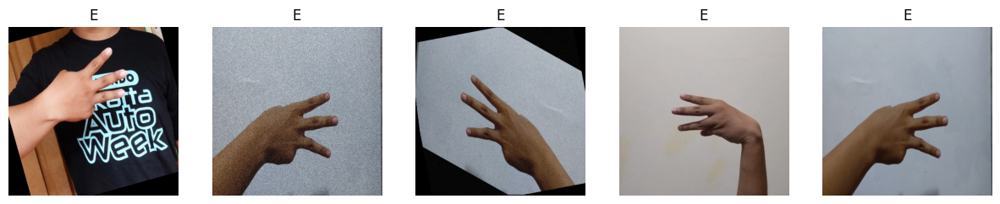

Class: X - Sample Quantity: 355
-----------------------------------------------------


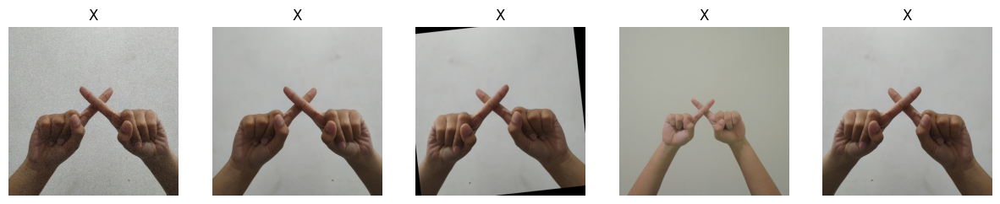

Class: Z - Sample Quantity: 360
-----------------------------------------------------


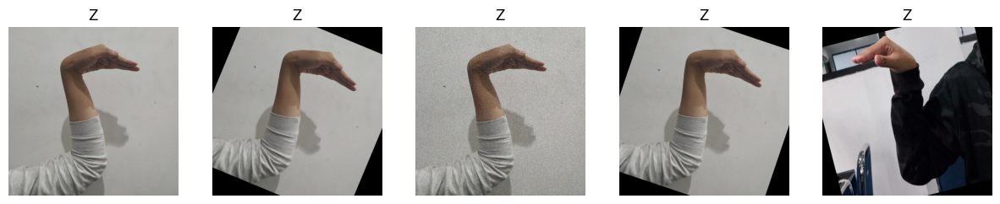

Class: U - Sample Quantity: 355
-----------------------------------------------------


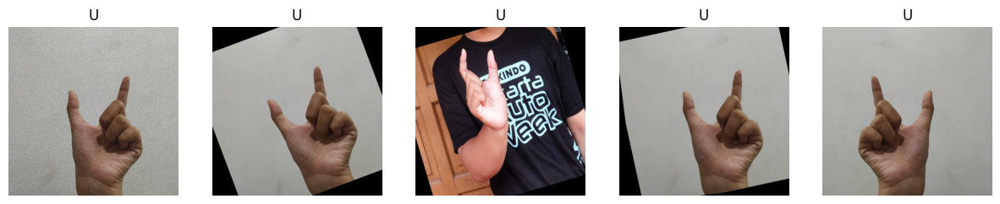

Class: W - Sample Quantity: 360
-----------------------------------------------------


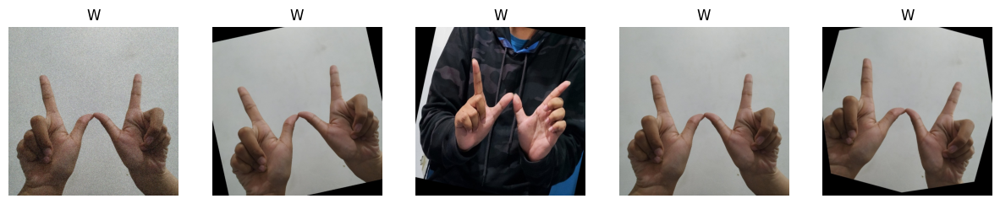

Class: O - Sample Quantity: 357
-----------------------------------------------------


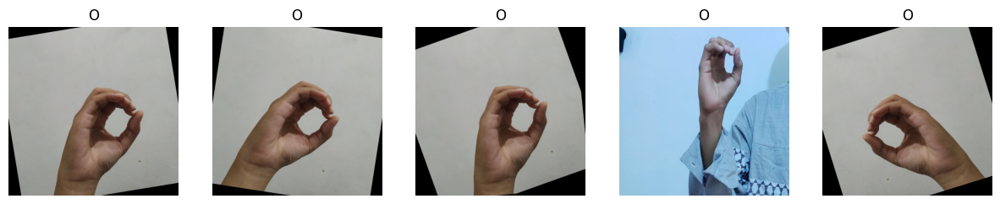

Class: Q - Sample Quantity: 348
-----------------------------------------------------


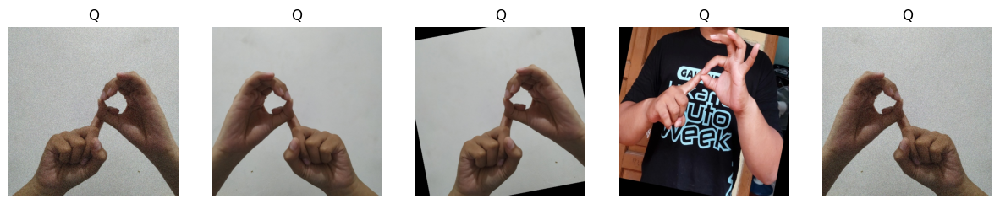

Class: I - Sample Quantity: 360
-----------------------------------------------------


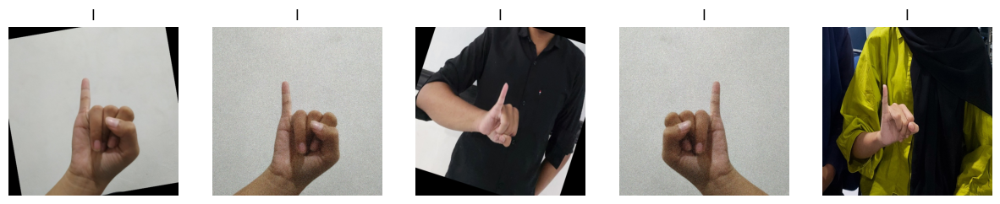

Class: M - Sample Quantity: 355
-----------------------------------------------------


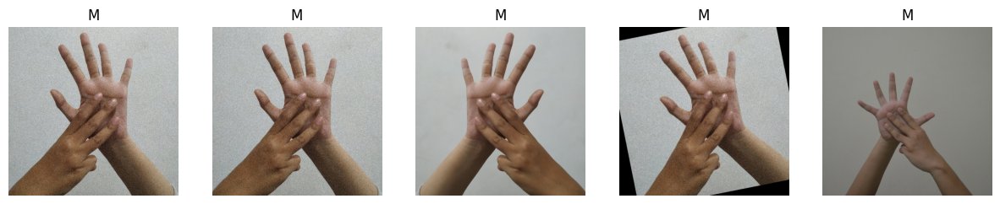

Class: N - Sample Quantity: 350
-----------------------------------------------------


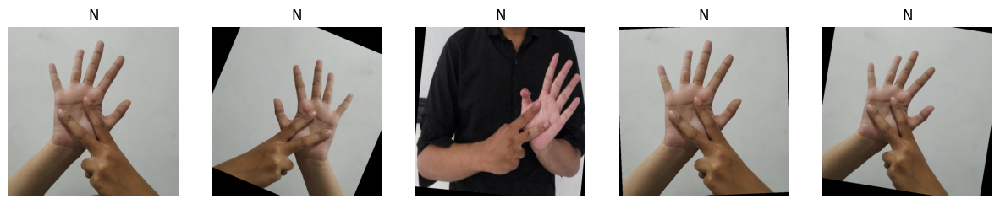

Class: Y - Sample Quantity: 328
-----------------------------------------------------


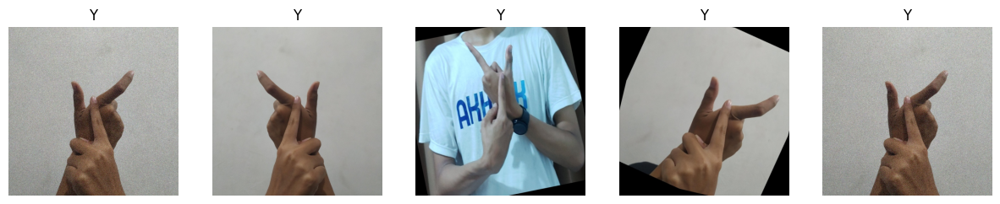


Validation Dataset:


Class: A - Sample Quantity: 88
-----------------------------------------------------


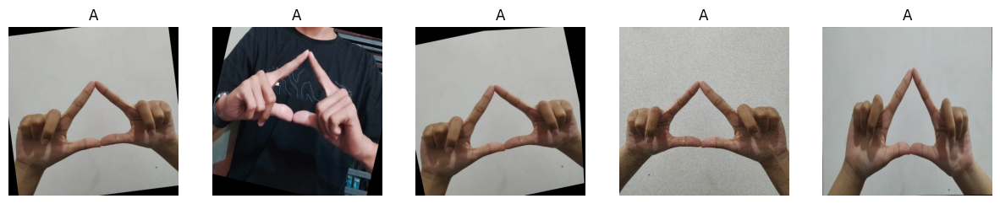

Class: P - Sample Quantity: 90
-----------------------------------------------------


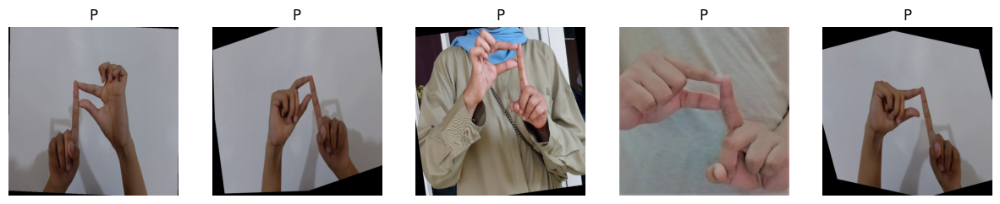

Class: K - Sample Quantity: 87
-----------------------------------------------------


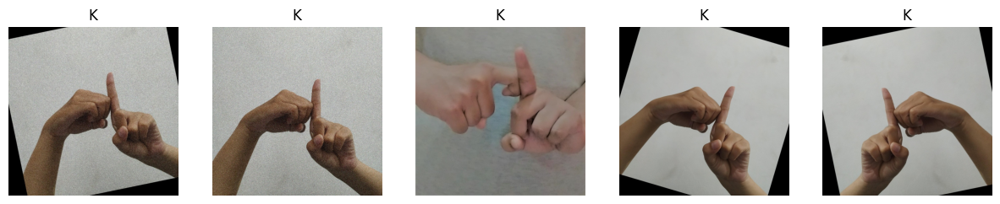

Class: L - Sample Quantity: 90
-----------------------------------------------------


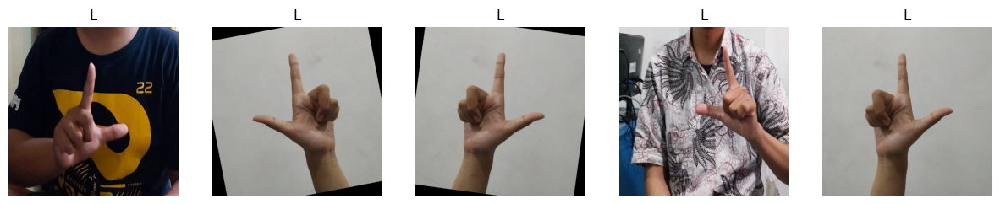

Class: J - Sample Quantity: 90
-----------------------------------------------------


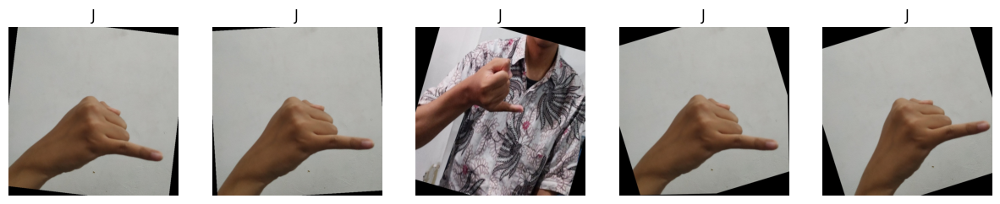

Class: D - Sample Quantity: 87
-----------------------------------------------------


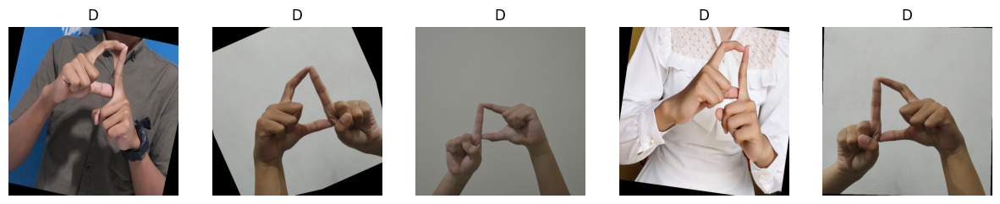

Class: R - Sample Quantity: 88
-----------------------------------------------------


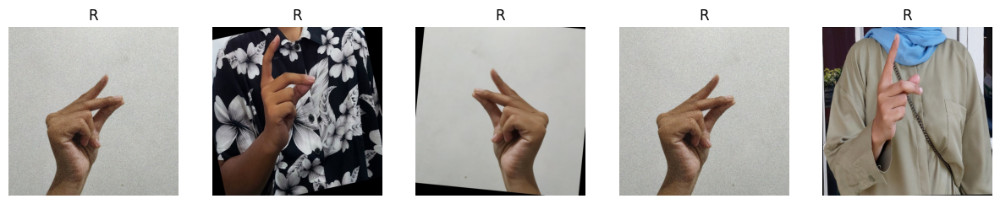

Class: B - Sample Quantity: 88
-----------------------------------------------------


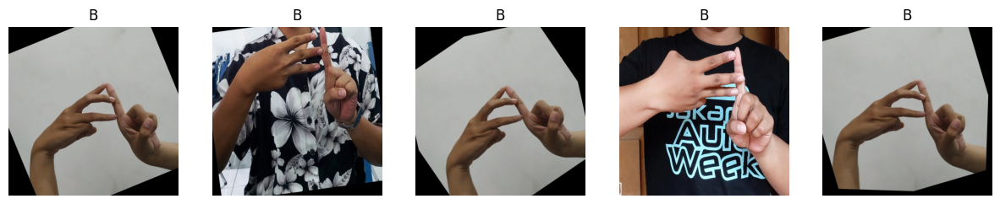

Class: H - Sample Quantity: 87
-----------------------------------------------------


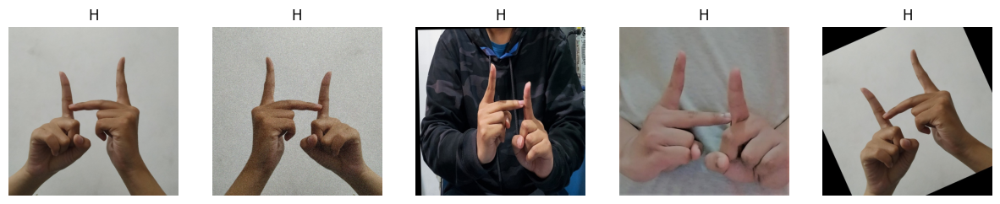

Class: S - Sample Quantity: 86
-----------------------------------------------------


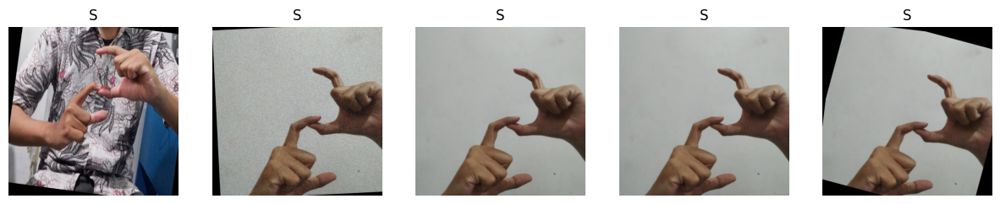

Class: C - Sample Quantity: 86
-----------------------------------------------------


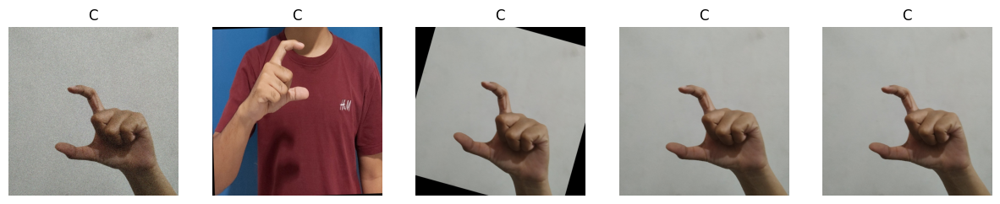

Class: T - Sample Quantity: 90
-----------------------------------------------------


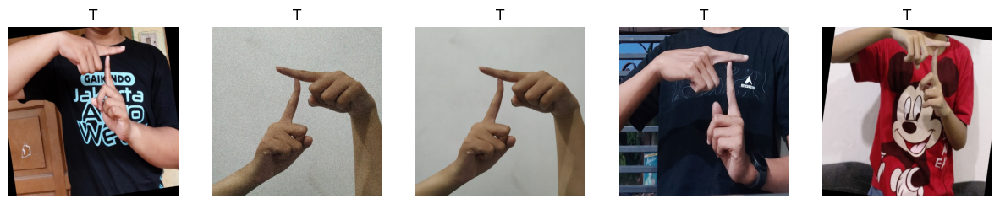

Class: F - Sample Quantity: 90
-----------------------------------------------------


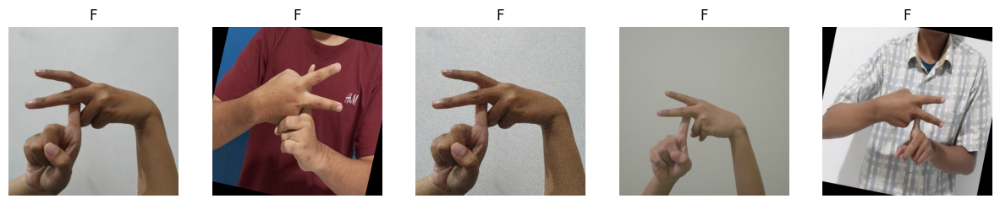

Class: V - Sample Quantity: 90
-----------------------------------------------------


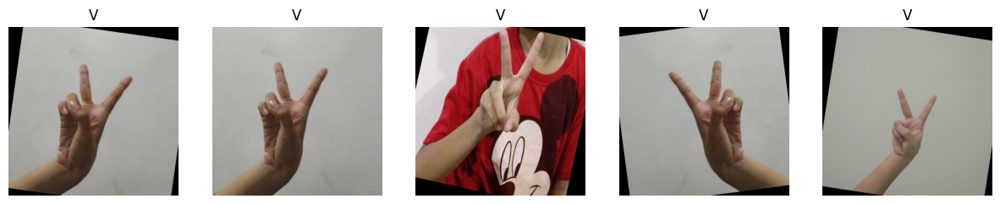

Class: G - Sample Quantity: 90
-----------------------------------------------------


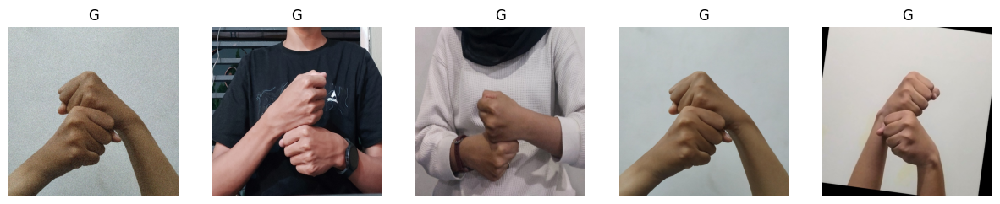

Class: E - Sample Quantity: 89
-----------------------------------------------------


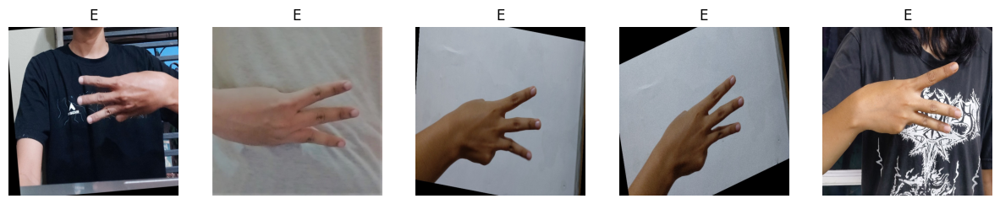

Class: X - Sample Quantity: 89
-----------------------------------------------------


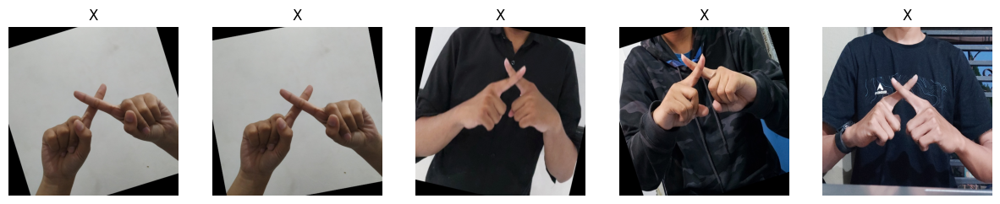

Class: Z - Sample Quantity: 90
-----------------------------------------------------


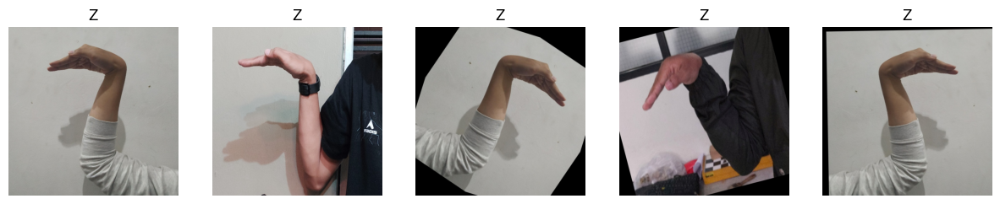

Class: U - Sample Quantity: 89
-----------------------------------------------------


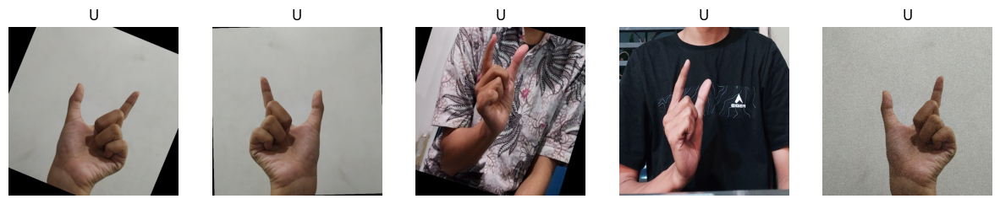

Class: W - Sample Quantity: 90
-----------------------------------------------------


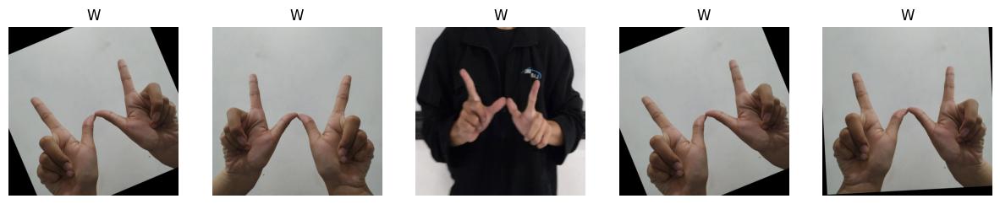

Class: O - Sample Quantity: 90
-----------------------------------------------------


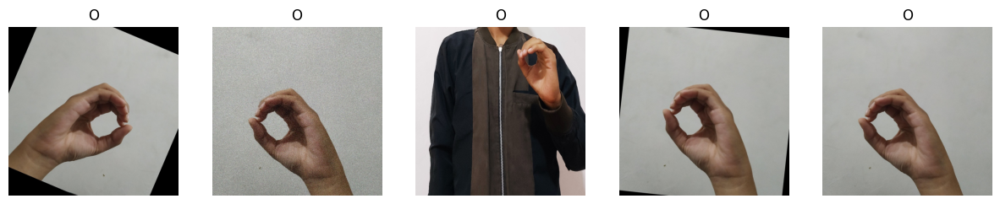

Class: Q - Sample Quantity: 87
-----------------------------------------------------


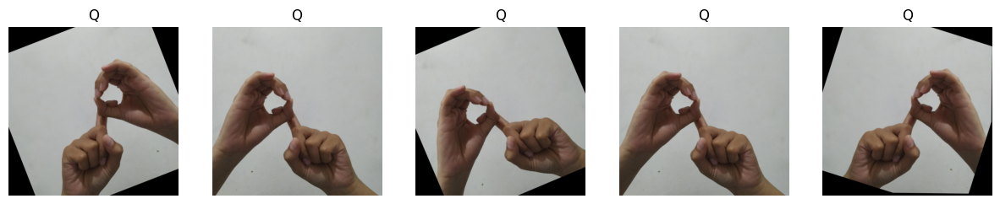

Class: I - Sample Quantity: 90
-----------------------------------------------------


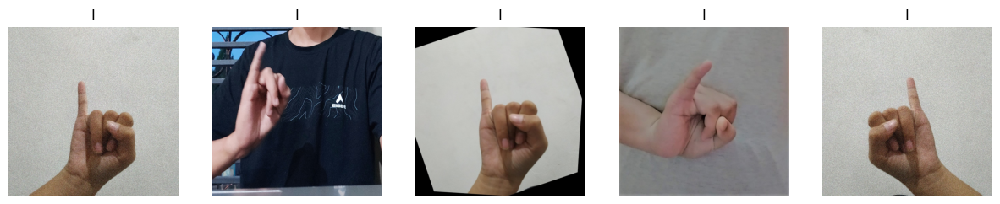

Class: M - Sample Quantity: 89
-----------------------------------------------------


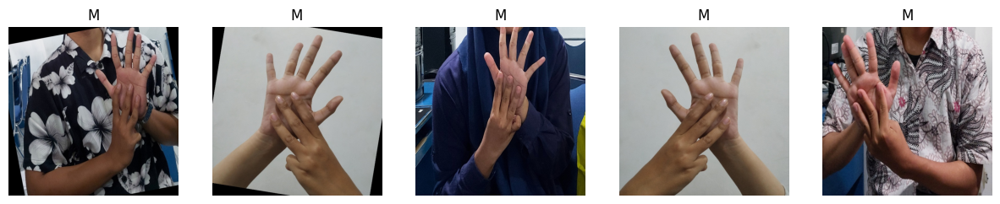

Class: N - Sample Quantity: 88
-----------------------------------------------------


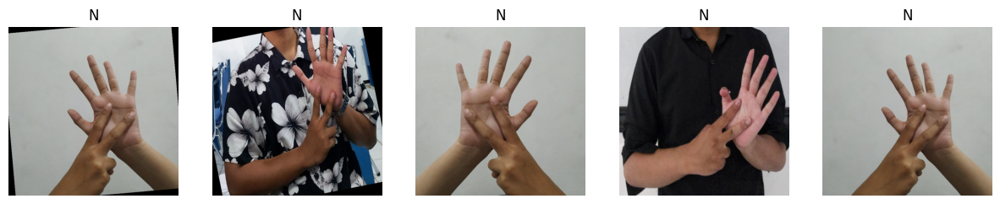

Class: Y - Sample Quantity: 83
-----------------------------------------------------


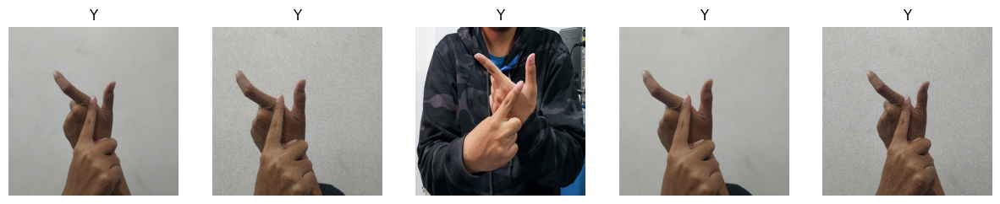

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# for making plot

BASE_DIR = '/content/bisindo/images'

TRAIN_DIR = os.path.join(BASE_DIR, 'train')
VAL_DIR = os.path.join(BASE_DIR, 'val')


#create dictionary
train_class_counts = {}
val_class_counts = {}

def display_class_samples(path_dataset, class_counts):
    for class_name in os.listdir(path_dataset):
        class_folder = os.path.join(path_dataset, class_name)
        #Loop folder
        if os.path.isdir(class_folder):
            # count imgs in each class
            num_images = len(os.listdir(class_folder))
            class_counts[class_name] = num_images

            # plot random imgs, not sure why it's not in alphabetical order?
            print(f'Class: {class_name} - Sample Quantity: {num_images}')
            print('-----------------------------------------------------')
            plt.figure(figsize=(15, 10))
            for i, image_file in enumerate(os.listdir(class_folder)[:5]):
                image_path = os.path.join(class_folder, image_file)
                plt.subplot(1, 5, i + 1)
                image = mpimg.imread(image_path)
                plt.imshow(image)
                plt.title(class_name)
                plt.axis('off')
            plt.show()

# show imgs and its total in train dataset
if os.path.exists(TRAIN_DIR):
    print('Training Dataset:')
    print('\n')
    display_class_samples(TRAIN_DIR, train_class_counts)
else:
    print('Folder train tidak ditemukan.')

# for val dataset
if os.path.exists(VAL_DIR):
    print('\nValidation Dataset:')
    print('\n')
    display_class_samples(VAL_DIR, val_class_counts)
else:
    print('Folder val tidak ditemukan.')

In [ ]:
import os
import cv2 # extract key features from each imgs
import numpy as np
from imutils import paths

#Menghitung hash gambar menggunakan metode dhash
def dhash(image, hashSize=8):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    resized = cv2.resize(gray, (hashSize + 1, hashSize))
    diff = resized[:, 1:] > resized[:, :-1]
    return sum([2 ** i for (i, v) in enumerate(diff.flatten()) if v]) #  generate hash

#Menentukan direktori dataset dan pengaturan menghapus gambar duplikat
dataset_dir = BASE_DIR
remove_duplicates = True

#Menghitung hash masing-masing gambar
print('[INFO] computing image hashes...')
imagePaths = list(paths.list_images(dataset_dir))
hashes = {}

#Loop memproses gambar yang ada di dataset
for imagePath in imagePaths:
    image = cv2.imread(imagePath)
    img_hash = dhash(image)
    img_list = hashes.get(img_hash, [])
    img_list.append(imagePath)
    hashes[img_hash] = img_list

#Loop untuk menemukan duplikat dan menghapus gambar duplikat
# find from img hash of likely similar value
for (img_hash, duplicatePaths) in hashes.items():
    if len(duplicatePaths) > 1:
        if not remove_duplicates:
            montage = None
            for path in duplicatePaths:
                image = cv2.imread(path)
                image = cv2.resize(image, (150, 150))
                if montage is None:
                    montage = image
                else:
                    montage = np.hstack([montage, image])
            print(f"[INFO] hash: {img_hash}")
            cv2.imshow('Montage', montage)
            cv2.waitKey(0)
        else:
            for duplicate_path in duplicatePaths[1:]:
                os.remove(duplicate_path)
                print(f"[INFO] Removed duplicate: {duplicate_path}")


[INFO] computing image hashes...
[INFO] Removed duplicate: /content/bisindo/images/val/A/flip065.jpg
[INFO] Removed duplicate: /content/bisindo/images/val/A/augmented_image_2.jpg
[INFO] Removed duplicate: /content/bisindo/images/val/A/augmented_image_18.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/flip088.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/flip066.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/flip089.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/flip062.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/flip051.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/augmented_image_88.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/augmented_image_68.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/augmented_image_64.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/augmented_image_54.jpg
[INFO] Removed duplicate: /content/bisindo/images/train/A/augmented_

In [ ]:
duplicate_count = 0

for (img_hash, duplicatePaths) in hashes.items():
    if len(duplicatePaths) > 1:
        duplicate_count += len(duplicatePaths) - 1

# Menampilkan jumlah total gambar duplikat yang telah dihapus
print(f"Total gambar duplikat yang dihapus: {duplicate_count}")

Total gambar duplikat yang dihapus: 1581


In [ ]:
from sklearn.model_selection import train_test_split

# Paths
TEST_DIR = os.path.join(BASE_DIR, 'test')

# Create the test directory if it doesn't exist
os.makedirs(TEST_DIR, exist_ok=True)

# Percentage of validation data to move to test
test_split_ratio = 0.5

# Process each class directory
for class_name in os.listdir(VAL_DIR):
    class_val_dir = os.path.join(VAL_DIR, class_name)
    class_test_dir = os.path.join(TEST_DIR, class_name)

    # Skip if not a directory
    if not os.path.isdir(class_val_dir):
        continue

    # Create corresponding class directory in the test folder
    os.makedirs(class_test_dir, exist_ok=True)

    # Get list of all images in the class's validation folder
    images = os.listdir(class_val_dir)
    images = [img for img in images if img.endswith(('.jpg', '.png', '.jpeg'))]

    # Split images into validation and test sets
    val_images, test_images = train_test_split(images, test_size=test_split_ratio, random_state=42)

    # Move test images to the test directory
    for img in test_images:
        src = os.path.join(class_val_dir, img)
        dest = os.path.join(class_test_dir, img)
        shutil.move(src, dest)

print("Validation split completed. Test data created in:", TEST_DIR)


Test data created in: /content/bisindo/images/test


In [ ]:
# Fungsi untuk menghitung total gambar dan distribusi per kelas
def count_total_images(folder_path):
    total_count = 0
    class_counts = {}
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)
        if os.path.isdir(class_folder):
            count = len([f for f in os.listdir(class_folder) if f.endswith(('jpg', 'png'))])
            class_counts[class_name] = count
            total_count += count
    return class_counts, total_count

# Menghitung total gambar dan distribusi di folder train, val, dan test
train_class_counts, train_total = count_total_images(TRAIN_DIR)
val_class_counts, val_total = count_total_images(VAL_DIR)
test_class_counts, test_total = count_total_images(TEST_DIR)

print(f"Total gambar di folder train: {train_total}")
print(f"Total gambar di folder val: {val_total}")
print(f"Total gambar di folder test: {test_total}")

Total gambar di folder train: 7863
Total gambar di folder val: 1011
Total gambar di folder test: 1015


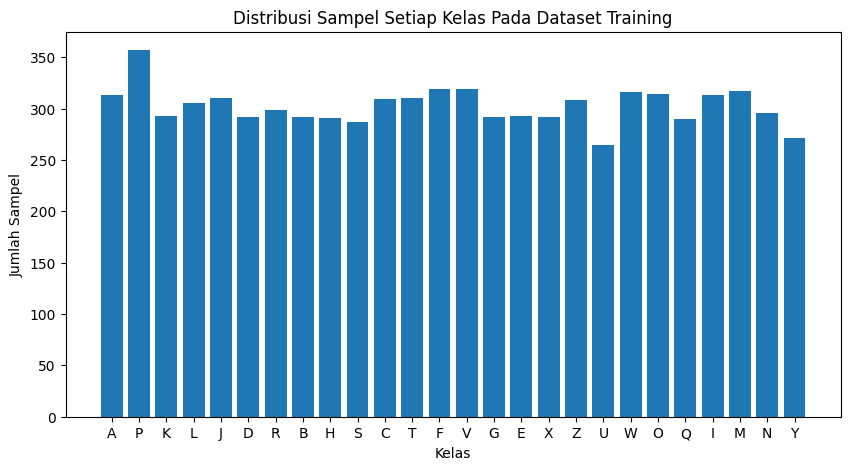

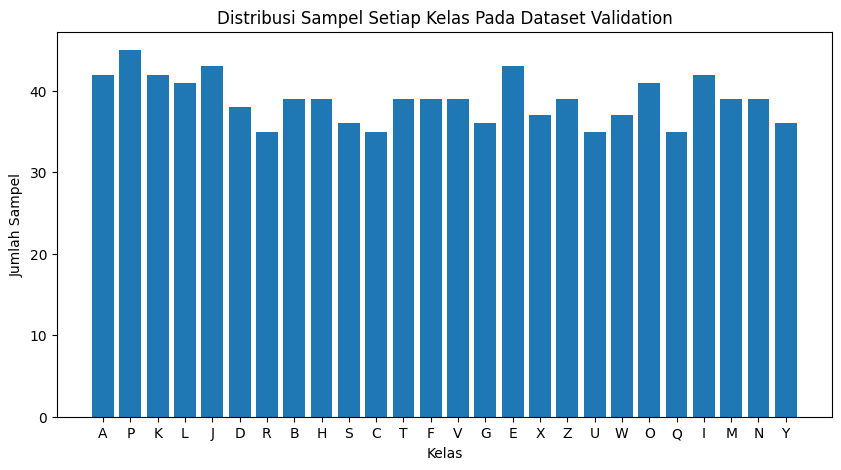

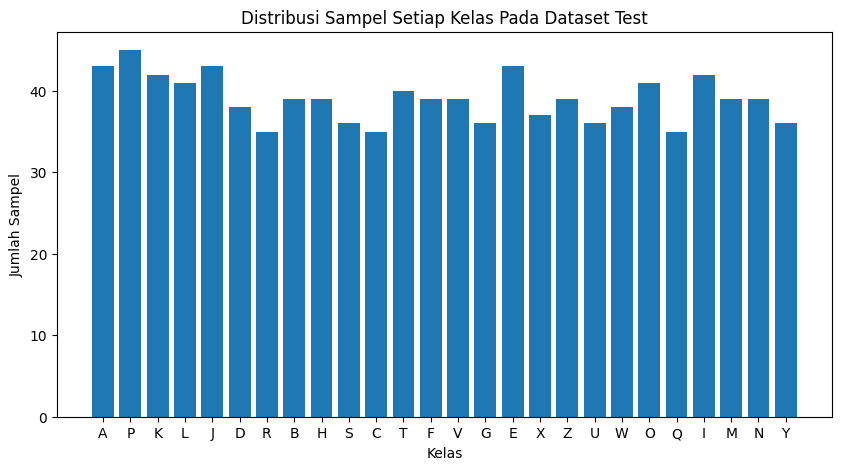

In [ ]:
# Menampilkan distribusi sampel setiap kelas dalam bentuk grafik
def plot_class_distribution(class_counts, dataset_name):
    plt.figure(figsize=(10, 5))
    plt.bar(class_counts.keys(), class_counts.values())
    plt.title(f'Distribusi Sampel Setiap Kelas Pada Dataset {dataset_name}')
    plt.xlabel('Kelas')
    plt.ylabel('Jumlah Sampel')
    plt.xticks(rotation=0)
    plt.show()

# Plot distribusi sampel
plot_class_distribution(train_class_counts, "Training")
plot_class_distribution(val_class_counts, "Validation")
plot_class_distribution(test_class_counts, "Test")

#Data Normalization

In [ ]:
import tensorflow as tf

IMAGE_SIZE = (224, 224)
IMAGE_SHAPE = IMAGE_SIZE + (3,)

BATCH_SIZE = 32

train_dataset = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
)

val_dataset = tf.keras.utils.image_dataset_from_directory(
    VAL_DIR,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
)

test_dataset = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
)

Found 7863 files belonging to 26 classes.
Found 1011 files belonging to 26 classes.
Found 1015 files belonging to 26 classes.


In [ ]:
SHUFFLE_BUFFER_SIZE = 100
PREFETCH_BUFFER_SIZE = tf.data.AUTOTUNE

train_dataset_prepared = (train_dataset
                       .shuffle(SHUFFLE_BUFFER_SIZE)
                       .cache()
                       .prefetch(PREFETCH_BUFFER_SIZE)
                       )

val_dataset_prepared = (val_dataset
                      .shuffle(SHUFFLE_BUFFER_SIZE)
                      .cache()
                      .prefetch(PREFETCH_BUFFER_SIZE)
                    )

test_dataset_prepared = (test_dataset
                      .cache()
                      .prefetch(PREFETCH_BUFFER_SIZE)
                    )

#Modeling using MobilenetV2 Transfer Learning


In [ ]:
# use mobilenetV2 as base model for transfer learning
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [ ]:
# Create the base model from the pre-trained model MobileNet V2
base_model = tf.keras.applications.MobileNetV2(input_shape= IMAGE_SHAPE,
                                               include_top= False, # exclude classification layers, for feature extraction
                                               weights= 'imagenet')

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# freeze the base model by making it non-trainable
base_model.trainable = False

In [ ]:
base_model.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Hyperparameter for learning rate

# Define a learning rate schedule using tf.keras.optimizers.schedules
initial_lr = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate= initial_lr,
    decay_steps= 10000,  # How often to apply the decreasing lr (every 10.000 steps)
    decay_rate= 0.5,  # how much reduced - reduce by half
    staircase= True # keep changing every decay_steps, instead of every step
)

In [ ]:
# create model

# turn preprocess into keras
class PreprocessingLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super(PreprocessingLayer, self).__init__(**kwargs)
        self.preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

    def call(self, inputs):
        return self.preprocess_input(inputs)

inputs = tf.keras.Input(shape=IMAGE_SHAPE)
x = PreprocessingLayer()(inputs)  # part of keras layer
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(26, activation='softmax')(x)

model = tf.keras.Model(inputs, outputs)

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing_layer                  │ (None, 224, 224, 3)         │               0 │
│ (PreprocessingLayer)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 26)                  │          33,306 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,291,290 (8.74 MB)

 Trainable params: 33,306 (130.10 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    metrics=['accuracy']
)

In [ ]:
history = model.fit(
      train_dataset_prepared,
      epochs=25,
      validation_data=val_dataset_prepared
)

Epoch 1/25
246/246 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - accuracy: 0.4460 - loss: 2.1772 - val_accuracy: 0.8457 - val_loss: 0.6772
Epoch 2/25
246/246 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - accuracy: 0.8337 - loss: 0.6452 - val_accuracy: 0.8892 - val_loss: 0.4631
Epoch 3/25
246/246 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - accuracy: 0.8935 - loss: 0.4327 - val_accuracy: 0.9139 - val_loss: 0.3623
Epoch 4/25
246/246 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - accuracy: 0.9204 - loss: 0.3219 - val_accuracy: 0.9199 - val_loss: 0.3063
Epoch 5/25
246/246 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - accuracy: 0.9425 - loss: 0.2567 - val_accuracy: 0.9298 - val_loss: 0.2716
Epoch 6/25
246/246 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - accuracy: 0.9588 - loss: 0.2038 - val_accuracy: 0.9347 - val_loss: 0.2479
Epoch 7/25
246/246 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - accuracy: 0.9611 - loss: 0.1747 - val_accuracy: 0.9416 - val_loss: 0.2285
Epoch 8/25
246/246 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - accuracy: 0.9713 - loss: 0.1411 - val

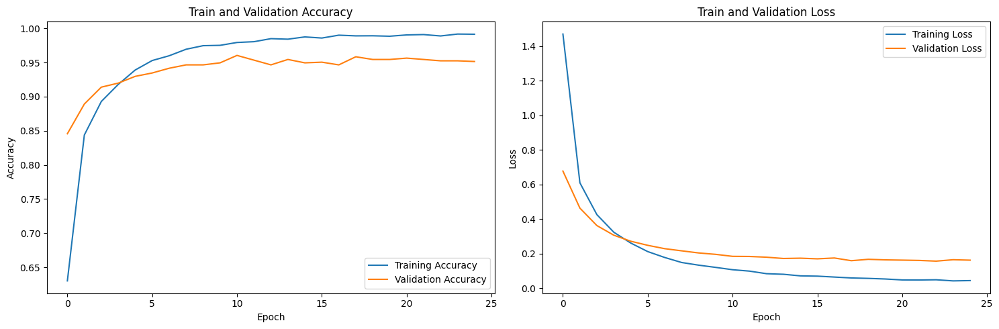

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot Accuracy
axes[0].plot(history.history['accuracy'], label='Training Accuracy')
axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
axes[0].set_title('Train and Validation Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

# Plot Loss
axes[1].plot(history.history['loss'], label='Training Loss')
axes[1].plot(history.history['val_loss'], label='Validation Loss')
axes[1].set_title('Train and Validation Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()

plt.tight_layout()
plt.show()


# Save Model

In [ ]:
# save model as SavedModel

export_path = 'handgesture_model'  # Directory name
tf.saved_model.save(model, export_path)

In [ ]:
# turn directory to zip
shutil.make_archive('handgesture_model', 'zip', 'handgesture_model')

'/content/handgesture_model.zip'

In [ ]:
from google.colab import files

# Download the zip file
files.download('handgesture_model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# save as .h5 file

# model.save('handgesture_model.h5')
# loaded_model = load_model("my_model.h5", custom_objects={"PreprocessingLayer": PreprocessingLayer})

In [ ]:
# Save as tflite model

# converter = tf.lite.TFLiteConverter.from_keras_model(model)
# tflite_model = converter.convert()

# with open("model.tflite", "wb") as f:
#     f.write(tflite_model)

# Handling Test

In [ ]:
test_loss, test_accuracy = model.evaluate(test_dataset_prepared)
print("Test Accuracy:", test_accuracy)

32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - accuracy: 0.9654 - loss: 0.1131
Test Accuracy: 0.9586206674575806


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Prediksi label dari model
y_pred = np.argmax(model.predict(test_dataset_prepared), axis=1)

# Ambil label sebenarnya dari dataset test
y_true = np.concatenate([y.numpy() for _, y in test_dataset_prepared], axis=0)
# Mengambil indeks kelas dari one-hot encoding
y_true = np.argmax(y_true, axis=1)

# Definisikan kelas label
classes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']

# Hitung dan tampilkan classification report
report = classification_report(y_true, y_pred, target_names=classes)
print('Classification Report')
print(report)


32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step
Classification Report
              precision    recall  f1-score   support

           A       0.95      0.95      0.95        43
           B       0.97      0.95      0.96        39
           C       0.92      0.97      0.94        35
           D       0.97      0.92      0.95        38
           E       0.98      0.98      0.98        43
           F       0.97      1.00      0.99        39
           G       1.00      1.00      1.00        36
           H       1.00      0.97      0.99        39
           I       0.95      0.86      0.90        42
           J       1.00      0.93      0.96        43
           K       1.00      0.95      0.98        42
           L       0.95      0.90      0.93        41
           M       0.90      0.97      0.94        39
           N       0.97      0.92      0.95        39
           O       1.00      1.00      1.00        41
           P       0.90      1.00      0.95        45
           Q      